## Data acquisition and preparation
### Surge Data
The data shown below is NOAA's P-surge 2.6 Probabilistic Hurricane Storm Surge (with tide) model. It was downloaded from <a href="https://slosh.nws.noaa.gov/psurge2.0/index.php?S=Florence2018&Adv=56&Ty=gt1&Z=m1&D=agl&Ti=cum&Msg=17&Help=about">this location</a> as a shape file, then clipped to the state of North Carolina in QGIS. 

### Footprints
Footprints of North Carolina were provided to DigitalGlobe from Ecopia. They are current as of 8/20/2018. 

## A first look at Storm Surge

### What is storm surge?
According to <a href="https://www.nhc.noaa.gov/surge/">NOAA</a>, storm surge is an abnormal rise of water generated by a storm, over and above the predicted astronomical tides. In many cases, it can be the greatest threat to life and property from a hurricane. Storm surge is produced when water is pushed toward the shore by the forces of storm winds.

North Carolina's extensive inlets and shallow continental shelf put its coastal regions at particular risk for storm surge during Hurricane Florence. 

### Reading the data
The plots shown below show storm surge probabilities in North Carolina's Wilmington County during Hurricane Florence at 1, 3, 6, and 9 feet. Each increment indicates the level of flooding--for example, the P-surge probability at 1 foot shows the areas at risk of having one foot of flooding or greater due to storm surge.

#### Install and import packages

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from gbdxtools import CatalogImage,TmsImage
from gbdxtools import Interface
# Initialize gbdx interface
gbdx = Interface() 
from gbdxtools.task import env
from shapely.geometry import box, shape, Polygon
from shapely.ops import cascaded_union, transform
from rasterio import features   
%matplotlib inline
import json
import sys
import requests

## Reading in the data
We will begin by reading in the storm surge data for Willmington County (a geojson)  from an s3 bucket and loading it into the notebook. We'll then seperate the data by level of surge--1, 3, 6, and 9 ft. 

In [3]:
surge_s3 = 'https://s3.amazonaws.com/gbdx-training/florence_flooding/wilmington_surges.geojson'

In [4]:
response = requests.get(surge_s3)
surge_data = json.loads(response.content)

In [5]:
surge_6_ft = []
surge_1_ft = []
surge_3_ft = []
surge_9_ft = []
for f in surge_data['features']:
    if f['properties']['PSurge06c'] != 0:
        surge_6_ft.append(f['geometry'])
    elif f['properties']['PSurge01c'] != 0:
        surge_1_ft.append(f['geometry'])
    elif f['properties']['PSurge03c'] != 0:
        surge_3_ft.append(f['geometry'])
    elif f['properties']['PSurge09c'] != 0:
        surge_9_ft.append(f['geometry'])

## Load a catalog image
Next, let's collect a catalog id and create an image. The bounding box encapsulates Willmington County, our selected area of interest. 

In [6]:
catalog_id = env.inputs.get('catalog_id', '881e61e5-5c56-44bf-a0d0-c4f5260a8aff-inv')
bbox = [-77.95877516269685, 34.12314057669903, -77.7728256583214, 34.268989555749464]
image = CatalogImage(catalog_id, band_type="MS", bbox=bbox)
image_rgb=image.rgb()

## Mask the image with the storm surge levels
Now, lets visualize the data by masking it onto the image. Note: This step can take some time, up to 15 mins to complete. 

In [7]:
def json_to_mask_cumulative(json_surge,aoi,color,masked_img):
    geoms_surge= [shape(f) for f in json_surge \
                 if f['type'] == 'Polygon' or f['type'] == 'MultiPolygon']
    size_x,size_y=aoi.shape[2],aoi.shape[1]
    mask=features.rasterize(shapes=geoms_surge, out_shape=(size_y,size_x), transform=aoi.affine)
    for i in range(0,mask.shape[0]):
        for j in range(0,mask.shape[1]):
            if mask[i,j]==1:
                masked_img[i,j]=color
    return(masked_img)

In [27]:
%%time
## takes around 12 mins
surge_mask_1ft_cumulative=json_to_mask_cumulative(surge_1_ft,image,[0, 0, 255],image_rgb)
print('1 ft done')
surge_mask_3ft_cumulative=json_to_mask_cumulative(surge_3_ft,image,[0, 233, 255],surge_mask_1ft_cumulative)
print('3 ft done')
surge_mask_6ft_cumulative=json_to_mask_cumulative(surge_6_ft,image,[255, 221, 109],surge_mask_3ft_cumulative)
print('6 ft done')
surge_mask_9ft_cumulative=json_to_mask_cumulative(surge_9_ft,image,[244, 66, 72],surge_mask_6ft_cumulative)
print('9 ft done')

1 ft done
3 ft done
6 ft done
9 ft done
CPU times: user 15min 55s, sys: 0 ns, total: 15min 55s
Wall time: 15min 54s


In [28]:
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=(0,0,255/255), lw=4),
                    Line2D([0], [0], color=(0, 233/255, 255/255), lw=4),
                Line2D([0], [0], color=(255/255, 221/255, 109/255), lw=4),
                Line2D([0], [0], color=(244/255, 66/255, 72/255), lw=4),]

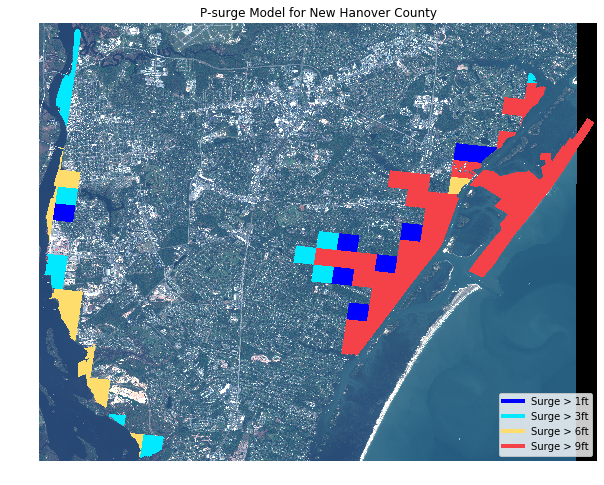

In [29]:
plt.figure(figsize=(10,10))
plt.imshow(surge_mask_9ft_cumulative)
plt.axis('off')
plt.title('P-surge Model for New Hanover County')
plt.legend(custom_lines, ['Surge > 1ft','Surge > 3ft','Surge > 6ft','Surge > 9ft'],loc='lower right')

## Query for Ecopia footprints
Now let's query Vector Services for all of the footprints in the AOI. The query bounds for this search will be the outline of the surge data. 

In [11]:
bounds_s3 = 'https://s3.amazonaws.com/gbdx-training/florence_flooding/data_outline.geojson'
response = requests.get(bounds_s3)
data_outline = json.loads(response.content)
query_bounds = shape(data_outline['features'][0]['geometry'])

In [12]:
query = 'ingest_source:Ecopia'
footprints = gbdx.vectors.query(query_bounds.wkt, query, index='vector-user-provided-ecopia-us-nc*', 
                                count=6e4)
print('There are %0.f Ecopia footprints in the region'%len(footprints))

There are 57398 Ecopia footprints in the region


## Find which footprints intersect with the storm surge model
Now, we will determine which Ecopia footprints match with each level of storm surge. This step takes about 10 mins to complete. For a shorter run time, you can adjust the `count` argument in `gbdx.vectors.query` to a smaller number.

In [13]:
%%time
##find buildings that intersect with each surge level, then add the surge level as a property to each footprint
for i,a in enumerate(footprints):
    a['properties']['surge_ft'] = 0
    building_shp = shape(a['geometry'])
    for j,b in enumerate(surge_9_ft):
        if shape(b).intersects(building_shp):
            a['properties']['surge_ft'] = 9
    if a['properties']['surge_ft']==0:
        for j,b in enumerate(surge_6_ft):
            if shape(b).intersects(building_shp):
                a['properties']['surge_ft'] = 6   
    if a['properties']['surge_ft']==0:
        for j,b in enumerate(surge_3_ft):
            if shape(b).intersects(building_shp):
                a['properties']['surge_ft'] = 3
    if a['properties']['surge_ft']==0:
        for j,b in enumerate(surge_1_ft):
            if shape(b).intersects(building_shp):
                a['properties']['surge_ft'] = 1

CPU times: user 5min 34s, sys: 0 ns, total: 5min 34s
Wall time: 5min 34s


In [14]:
##filter out all of the footprints that have zero surge level
filtered_points = list(filter(lambda a: a['properties']['surge_ft']!= 0, footprints))

## Display data in a slippy map
The last step is to take the footprints and load them into a slippy map. The colors for each building correspond to the P-Surge model displayed above. Each legend entry is explained below:
* Dark blue buildings have a surge level > 1ft
* Cyan buildings have a surge level > 3ft
* Orange buildings have a surge level > 6ft
* Pink buildings have a surge level > 9ft

There are also two different slippy maps. The first map simply shows all of the buildings impacted surge with the level of surge represented by color. The second map shows surge represented by both color and height--the taller the footprint, the higher level of storm surge it's predicted to have.


In [15]:
import json
from gbdxtools import FillStyle, StepExpression

In [26]:
fill_color = StepExpression(
    property_name='surge_ft',
    stops={
        1: '#0000FF',
        3: '#1FFCFF',
        6: '#ffdd6d',
        9: '#f44248', 
    })
gbdx.vectors.map(features=filtered_points, zoom=12, styles=FillStyle(color=fill_color, opacity=0.75))

<IPython.core.display.Javascript object>

In [24]:
from gbdxtools import FillExtrusionStyle

f = FillExtrusionStyle(height=['get', 'surge_ft'], color=fill_color, base=0, opacity=.8)

gbdx.vectors.map(features= filtered_points, zoom=12, styles=f)

<IPython.core.display.Javascript object>

## Review the numbers
Lastly, lets calculate how many footprints are in each level of surge. 

In [23]:
footprints_1_ft = list(filter(lambda a: a['properties']['surge_ft']== 1, filtered_points))
footprints_3_ft = list(filter(lambda a: a['properties']['surge_ft']== 3, filtered_points))
footprints_6_ft = list(filter(lambda a: a['properties']['surge_ft']== 6, filtered_points))
footprints_9_ft = list(filter(lambda a: a['properties']['surge_ft']== 9, filtered_points))
print("P-surge predicts that %0.f buildings will be affected by a 1 ft storm surge." %len(footprints_1_ft))
print("P-surge predicts that %0.f buildings will be affected by a 3 ft storm surge." %len(footprints_3_ft))
print("P-surge predicts that %0.f buildings will be affected by a 6 ft storm surge." %len(footprints_6_ft))
print("P-surge predicts that %0.f buildings will be affected by a 9 ft storm surge." %len(footprints_9_ft))

P-surge predicts that 891 buildings will be affected by a 1 ft storm surge.
P-surge predicts that 590 buildings will be affected by a 3 ft storm surge.
P-surge predicts that 215 buildings will be affected by a 6 ft storm surge.
P-surge predicts that 3241 buildings will be affected by a 9 ft storm surge.
